In [1]:
!mkdir -p ~/miniconda3
!wget https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh -O ~/miniconda3/miniconda.sh
!bash ~/miniconda3/miniconda.sh -b -u -p /usr/local/miniconda
!rm ~/miniconda3/miniconda.sh

--2026-07-16 07:45:02--  https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.32.241, 104.16.191.158, 2606:4700::6810:20f1, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.32.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 197303002 (188M) [application/octet-stream]
Saving to: ‘/root/miniconda3/miniconda.sh’

/root/miniconda3/mi 100%[===================>] 188.16M   332MB/s    in 0.6s    

2026-07-16 07:45:03 (332 MB/s) - ‘/root/miniconda3/miniconda.sh’ saved [197303002/197303002]

PREFIX=/usr/local/miniconda
Unpacking bootstrapper...
Unpacking payload...

Installing base environment...

Preparing transaction: ...working... done
Executing transaction: ...working... done
installation finished.
    You currently have a PYTHONPATH environment variable set. This may cause
    unexpected behavior when running the Python interpreter in Miniconda3.
    For best results, pleas

In [2]:
import os
import sys

os.environ["PATH"] = "/usr/local/miniconda/bin:" + os.environ["PATH"]
sys.path.insert(0, "/usr/local/miniconda/lib/python3.10/site-packages")

!conda --version

conda 26.5.3


In [3]:
!conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/main
!conda tos accept --override-channels --channel https://repo.anaconda.com/pkgs/r

accepted Terms of Service for https://repo.anaconda.com/pkgs/main
accepted Terms of Service for https://repo.anaconda.com/pkgs/r


In [4]:
!conda create -y -n clrnet python=3.8

Jupyter detected...
2 channel Terms of Service accepted
Retrieving notices: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | done
Channels:
 - defaults
Platform: linux-64
Solving environment: | done

## Package Plan ##

  environment location: /usr/local/miniconda/envs/clrnet

  added / updated specs:
    - python=3.8


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    pip-24.2                   |   py38h06a4308_0         2.2 MB
    python-3.8.20              |       he870216_0        23.8 MB
    setuptools-75.1.0          |   py38h06a4308_0         1.7 MB
    wheel-0.44.0               |   py38h06a4308_0         108 KB
    ------------------------------------------------------------
                                           Total:        27.8 MB

The following NEW packages will be INSTALLED:

  _libgcc_mutex    

In [5]:
!conda run -n clrnet pip install \
torch==1.8.1+cu111 \
torchvision==0.9.1+cu111 \
torchaudio==0.8.1 \
-f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 GB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 121.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 102.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 139.2 MB/s eta 0:00:00


In [6]:
!conda run -n clrnet python -c "import torch; print(torch.__version__)"

1.8.1+cu111


In [7]:
!git clone https://github.com/Turoad/CLRNet.git
%cd CLRNet

Cloning into 'CLRNet'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 171 (delta 29), reused 26 (delta 26), pack-reused 94 (from 1)
Receiving objects: 100% (171/171), 321.29 KiB | 10.04 MiB/s, done.
Resolving deltas: 100% (38/38), done.
/content/CLRNet


In [8]:
!conda run -n clrnet pip install mmcv-full==1.3.9 \
-f https://download.openmmlab.com/mmcv/dist/cu111/torch1.8.0/index.html

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.8.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.6/32.6 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 MB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.0/806.0 kB 36.4 MB/s eta 0:00:00


In [9]:
!conda run -n clrnet pip install mmdet==2.14.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 618.2/618.2 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 114.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 121.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 50.0 MB/s eta 0:00:00


In [10]:
!conda run -n clrnet pip install \
addict \
yapf \
opencv-python \
numpy==1.23.5 \
scikit-image \
scikit-learn \
matplotlib \
imageio \
imgaug \
pytorch-warmup \
ujson \
p_tqdm \
pathspec \
shapely \
tabulate

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 114.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 148.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 152.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 90.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 148.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 676.6/676.6 kB 38.6 MB/s eta 0:00:00
  Created wheel for p_tqdm: filename=p_tqdm-1.4.2-py3-none-any.whl size=5400 sha256=f34aca82917cc26aac6d56011fc06d203d6b40c64024ee9ec178bcb4a8f5da4d
  Stored in directory: /root/.cache

In [11]:
!conda run -n clrnet python setup.py build develop

running build
running build_py
creating build/lib.linux-x86_64-cpython-38/clrnet
copying clrnet/__init__.py -> build/lib.linux-x86_64-cpython-38/clrnet
creating build/lib.linux-x86_64-cpython-38/clrnet/ops
copying clrnet/ops/__init__.py -> build/lib.linux-x86_64-cpython-38/clrnet/ops
copying clrnet/ops/nms.py -> build/lib.linux-x86_64-cpython-38/clrnet/ops
creating build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/visualization.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/__init__.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/recorder.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/culane_metric.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/net_utils.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/tusimple_metric.py -> build/lib.linux-x86_64-cpython-38/clrnet/utils
copying clrnet/utils/lane.py -> build/lib.linux-x86_64-cpython-38/clr

In [12]:
!conda run -n clrnet python -c "import clrnet; print('CLRNet imported successfully')"

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/content/CLRNet/clrnet/__init__.py", line 1, in <module>
    from .ops import *
  File "/content/CLRNet/clrnet/ops/__init__.py", line 1, in <module>
    from .nms import nms
  File "/content/CLRNet/clrnet/ops/nms.py", line 29, in <module>
    from . import nms_impl
ImportError: libc10.so: cannot open shared object file: No such file or directory
ERROR conda.cli.main_run:execute(148): `conda run python -c import clrnet; print('CLRNet imported successfully')` failed. (See above for error)


In [13]:
!ls /usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib

libc10_cuda.so			  libnvToolsExt-24de1d56.so.1
libc10.so			  libshm.so
libcaffe2_detectron_ops_gpu.so	  libtorch_cpu.so
libcaffe2_module_test_dynamic.so  libtorch_cuda_cpp.so
libcaffe2_nvrtc.so		  libtorch_cuda_cu.so
libcaffe2_observers.so		  libtorch_cuda.so
libcudart-6d56b25a.so.11.0	  libtorch_global_deps.so
libgomp-7c85b1e2.so.1		  libtorch_python.so
libnvrtc-3a20f2b6.so.11.1	  libtorch.so
libnvrtc-builtins.so


In [14]:
!export LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:$LD_LIBRARY_PATH && \
conda run -n clrnet python -c "import clrnet; print('CLRNet imported successfully')"

CLRNet imported successfully


In [15]:
!unzip /content/culane_r18.pth.zip
!mkdir -p weights
!mv *.pth weights/

Archive:  /content/culane_r18.pth.zip
  inflating: culane_r18.pth          


In [16]:
!ls weights

culane_r18.pth


In [17]:
!conda run -n clrnet python main.py --help

usage: main.py [-h] [--work_dirs WORK_DIRS] [--load_from LOAD_FROM]
               [--resume_from RESUME_FROM] [--finetune_from FINETUNE_FROM]
               [--view] [--validate] [--test] [--gpus GPUS [GPUS ...]]
               [--seed SEED]
               config

Train a detector

positional arguments:
  config                train config file path

optional arguments:
  -h, --help            show this help message and exit
  --work_dirs WORK_DIRS
                        work dirs
  --load_from LOAD_FROM
                        the checkpoint file to load from
  --resume_from RESUME_FROM
                        the checkpoint file to resume from
  --finetune_from FINETUNE_FROM
                        the checkpoint file to resume from
  --view                whether to view
  --validate            whether to evaluate the checkpoint during training
  --test                whether to test the checkpoint on testing set
  --gpus GPUS [GPUS ...]
  --seed SEED           random seed


In [18]:
!ls tools

generate_seg_tusimple.py


In [22]:
%cd /content/CLRNet

/content/CLRNet


In [20]:
from google.colab import files
uploaded = files.upload()  # a file picker pops up — choose clrnet_infer_video.py

Saving clrnet_infer_video.py to clrnet_infer_video.py


In [23]:

!ls clrnet_infer_video.py   # should just echo the filename back, no error

clrnet_infer_video.py


In [24]:
import os
os.environ['LD_LIBRARY_PATH'] = '/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:' + os.environ.get('LD_LIBRARY_PATH', '')

In [28]:
!ffmpeg -y -i /content/my_dashcam_video.mp4 -frames:v 1 test.jpg

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [27]:
!find / -iname "*dashcam*" 2>/dev/null

/content/my_dashcam_video.mp4


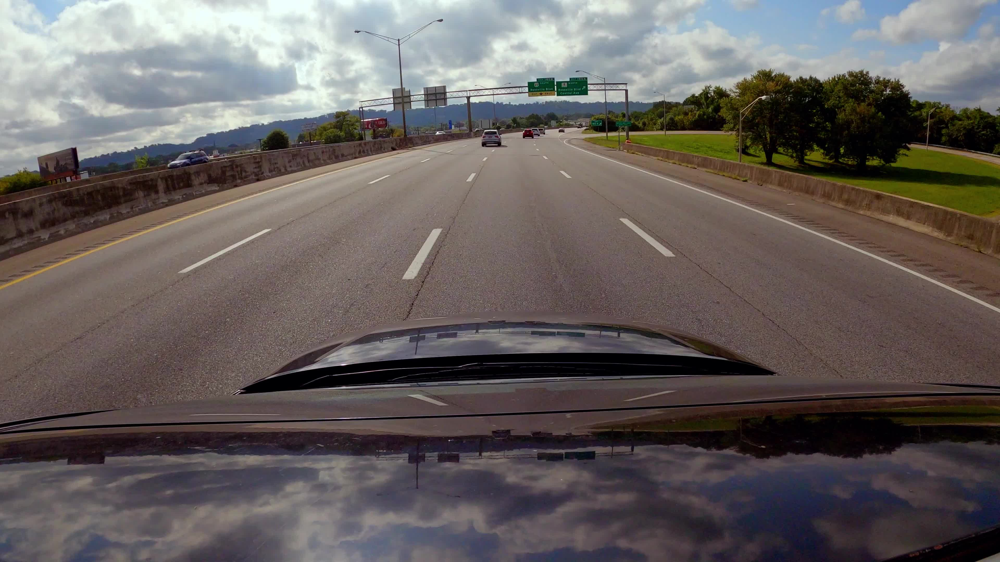

In [29]:
from IPython.display import Image
Image('test.jpg')

In [31]:
import cv2

In [33]:
!ls /usr/local/miniconda/envs/clrnet/bin/python

/usr/local/miniconda/envs/clrnet/bin/python


In [36]:
!/usr/local/miniconda/envs/clrnet/bin/python clrnet_infer_video.py --test-frame test.jpg --out test_out.jpg

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Detected 2 lane(s)
Saved test_out.jpg
Saved test_out_model_view.jpg (this is exactly what the model received)


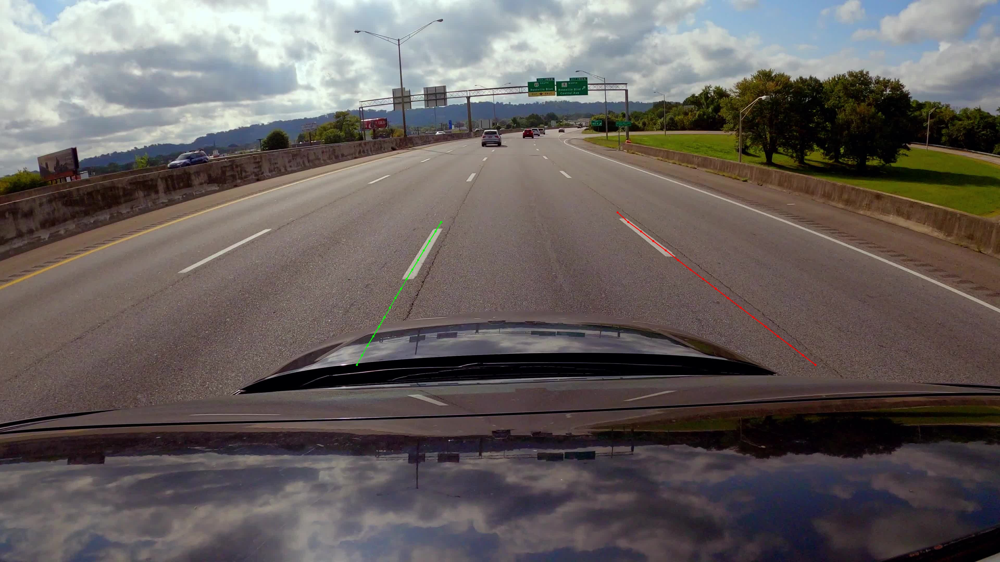

In [38]:
from IPython.display import Image
Image('test_out.jpg')

In [41]:
%%writefile check_cfg.py
from clrnet.utils.config import Config
cfg = Config.fromfile('configs/clrnet/clr_resnet18_culane.py')
print('max_lanes:', cfg.max_lanes)
print('conf_threshold:', cfg.test_parameters)

Writing check_cfg.py


In [42]:
%env LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib
!/usr/local/miniconda/envs/clrnet/bin/python check_cfg.py

env: LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib
max_lanes: 4
conf_threshold: {'conf_threshold': 0.4, 'nms_thres': 50, 'nms_topk': 4}


In [43]:
%%writefile test_lower_thresh.py
from clrnet.utils.config import Config
from clrnet_infer_video import build_model, process_single_frame

cfg, net, processes = build_model(
    'configs/clrnet/clr_resnet18_culane.py',
    'weights/culane_r18.pth'
)
cfg.test_parameters.conf_threshold = 0.25  # down from 0.4

process_single_frame(cfg, net, processes, 'test.jpg', 'test_out_lowthresh.jpg',
                      top_crop=0.15, bottom_crop=0.35)

Writing test_lower_thresh.py


In [45]:
!nvidia-smi

NVIDIA-SMI couldn't find libnvidia-ml.so library in your system. Please make sure that the NVIDIA Display Driver is properly installed and present in your system.
Please also try adding directory that contains libnvidia-ml.so to your system PATH.


In [46]:
%env LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib

env: LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib


In [47]:
!echo $LD_LIBRARY_PATH

/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib


In [48]:
import os
existing = os.environ.get('LD_LIBRARY_PATH', '')
new_path = '/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib'
os.environ['LD_LIBRARY_PATH'] = f'{new_path}:{existing}' if existing else new_path
print(os.environ['LD_LIBRARY_PATH'])

/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib


In [1]:
!nvidia-smi

Thu Jul 16 08:34:06 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
existing = os.environ.get('LD_LIBRARY_PATH', '')
torch_lib = '/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib'
os.environ['LD_LIBRARY_PATH'] = f'{torch_lib}:{existing}'
print(os.environ['LD_LIBRARY_PATH'])

/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:/usr/lib64-nvidia


In [3]:
!nvidia-smi
!/usr/local/miniconda/envs/clrnet/bin/python -c "import torch; print(torch.cuda.is_available())"

Thu Jul 16 08:34:46 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
!/usr/local/miniconda/envs/clrnet/bin/python test_lower_thresh.py

/usr/local/miniconda/envs/clrnet/bin/python: can't open file 'test_lower_thresh.py': [Errno 2] No such file or directory


In [5]:
!pwd
!find / -name "test_lower_thresh.py" 2>/dev/null

/content
/content/CLRNet/test_lower_thresh.py


In [6]:
%cd /content/CLRNet
!ls test_lower_thresh.py clrnet_infer_video.py

/content/CLRNet
clrnet_infer_video.py  test_lower_thresh.py


In [7]:
!/usr/local/miniconda/envs/clrnet/bin/python test_lower_thresh.py

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Detected 4 lane(s)
Saved test_out_lowthresh.jpg
Saved test_out_lowthresh_model_view.jpg (this is exactly what the model received)


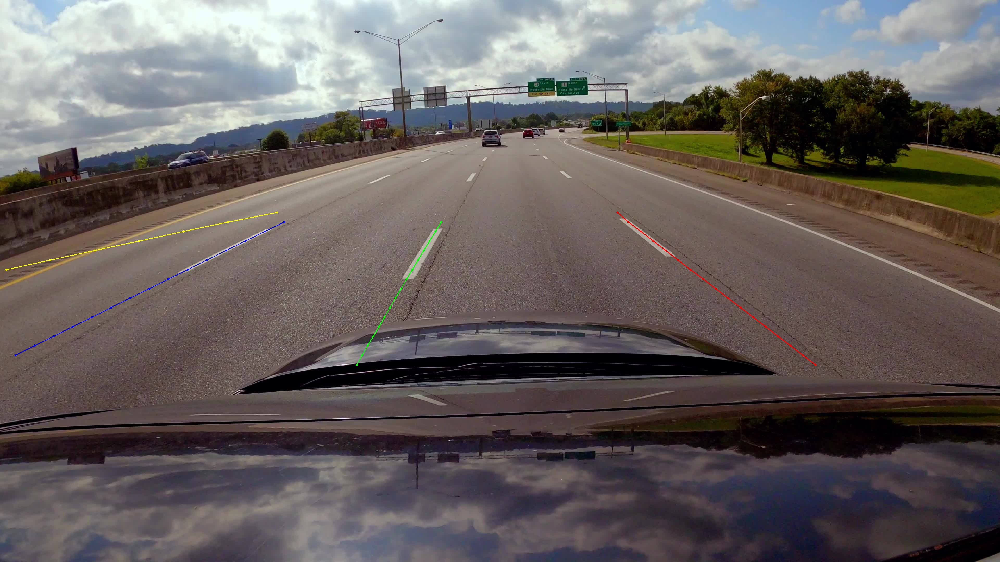

In [8]:
from IPython.display import Image
Image('test_out_lowthresh.jpg')

In [9]:
%%writefile check_frame.py
import sys
from clrnet_infer_video import build_model, process_single_frame

cfg, net, processes = build_model(
    'configs/clrnet/clr_resnet18_culane.py',
    'weights/culane_r18.pth'
)
cfg.test_parameters.conf_threshold = 0.25

process_single_frame(cfg, net, processes, sys.argv[1], sys.argv[2],
                      top_crop=0.15, bottom_crop=0.35)

Writing check_frame.py


In [11]:
!ffmpeg -y -ss 00:00:15 -i /content/my_dashcam_video.mp4 -frames:v 1 test2.jpg
!/usr/local/miniconda/envs/clrnet/bin/python check_frame.py test2.jpg test2_out.jpg

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

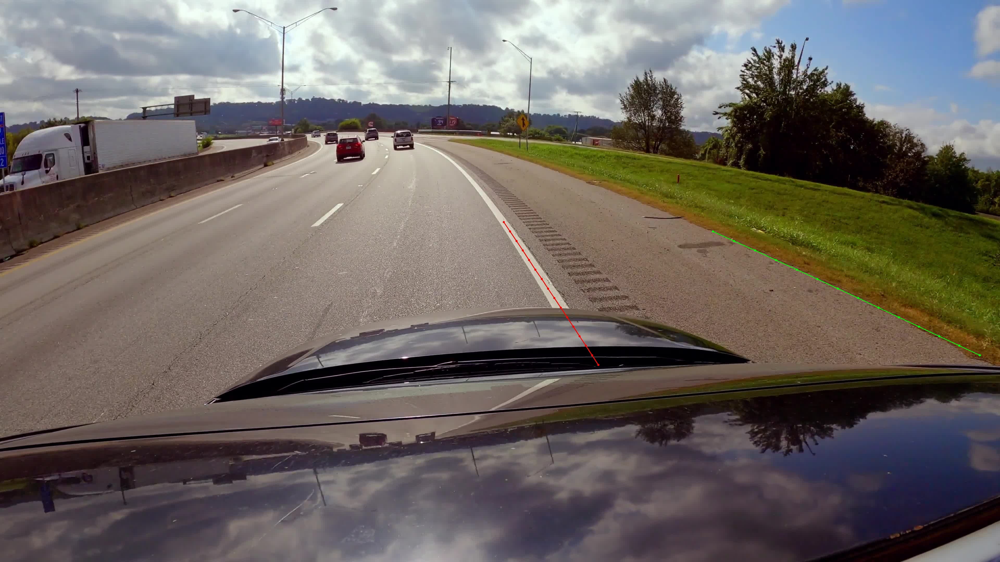

In [12]:
from IPython.display import Image
Image('test2_out.jpg')

In [15]:
!/usr/local/miniconda/envs/clrnet/bin/python compare_thresholds.py \
    --frames test.jpg test2.jpg test3.jpg \
    --thresholds 0.25 0.30 0.32 0.35 0.40 \
    --outdir threshold_compare

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
test.jpg              thresh=0.25  lanes=4  -> threshold_compare/test_t0.25.jpg
test.jpg              thresh=0.30  lanes=3  -> threshold_compare/test_t0.30.jpg
test.jpg              thresh=0.32  lanes=3  -> threshold_compare/test_t0.32.jpg
test.jpg              thresh=0.35  lanes=2  -> threshold_compare/test_t0.35.jpg
test.jpg              thresh=0.40  lanes=2  -> threshold_compare/test_t0.40.jpg
test2.jpg             thresh=0.25  lanes=2  -> threshold_compare/test2_t0.25.jpg
test2.jpg             thresh=0.30  lanes=2  -> threshold_compare/test2_t0.30.jpg
test2.jpg             thresh=0.32  lanes=2  -> threshold_compare/test2_t0.32.jpg
test2.jpg             thresh=0.35  lanes=2  -> threshold_compare/test2_t0.35.jpg
te

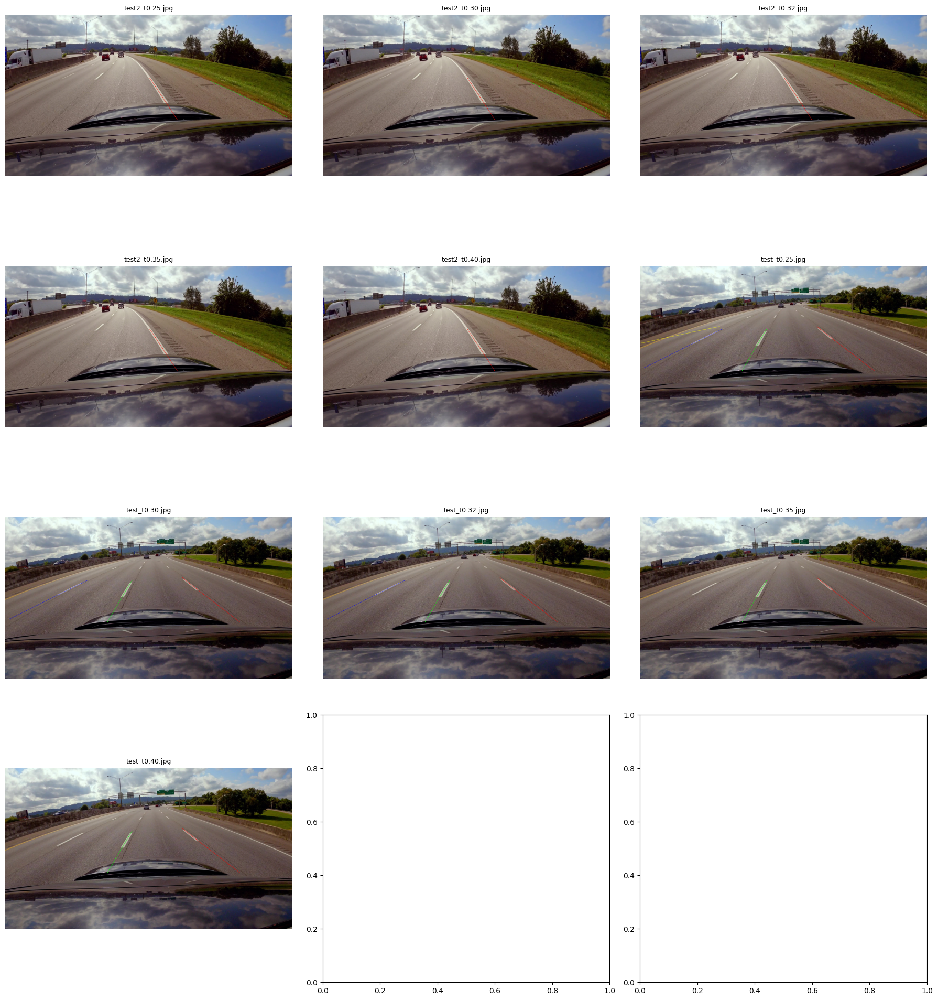

In [16]:
import matplotlib.pyplot as plt
import cv2, glob
paths = sorted(glob.glob("threshold_compare/*.jpg"))
n = len(paths)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(18, 5*rows))
for ax, p in zip(axes.flat, paths):
    img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    ax.imshow(img); ax.set_title(p.split("/")[-1], fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

In [17]:
!/usr/local/miniconda/envs/clrnet/bin/python compare_thresholds.py \
    --frames test.jpg test2.jpg test3.jpg \
    --thresholds 0.25 0.30 0.32 0.35 0.40 \
    --outdir threshold_compare

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
test.jpg              thresh=0.25  lanes=4  -> threshold_compare/test_t0.25.jpg
test.jpg              thresh=0.30  lanes=3  -> threshold_compare/test_t0.30.jpg
test.jpg              thresh=0.32  lanes=3  -> threshold_compare/test_t0.32.jpg
test.jpg              thresh=0.35  lanes=2  -> threshold_compare/test_t0.35.jpg
test.jpg              thresh=0.40  lanes=2  -> threshold_compare/test_t0.40.jpg
test2.jpg             thresh=0.25  lanes=2  -> threshold_compare/test2_t0.25.jpg
test2.jpg             thresh=0.30  lanes=2  -> threshold_compare/test2_t0.30.jpg
test2.jpg             thresh=0.32  lanes=2  -> threshold_compare/test2_t0.32.jpg
test2.jpg             thresh=0.35  lanes=2  -> threshold_compare/test2_t0.35.jpg
te

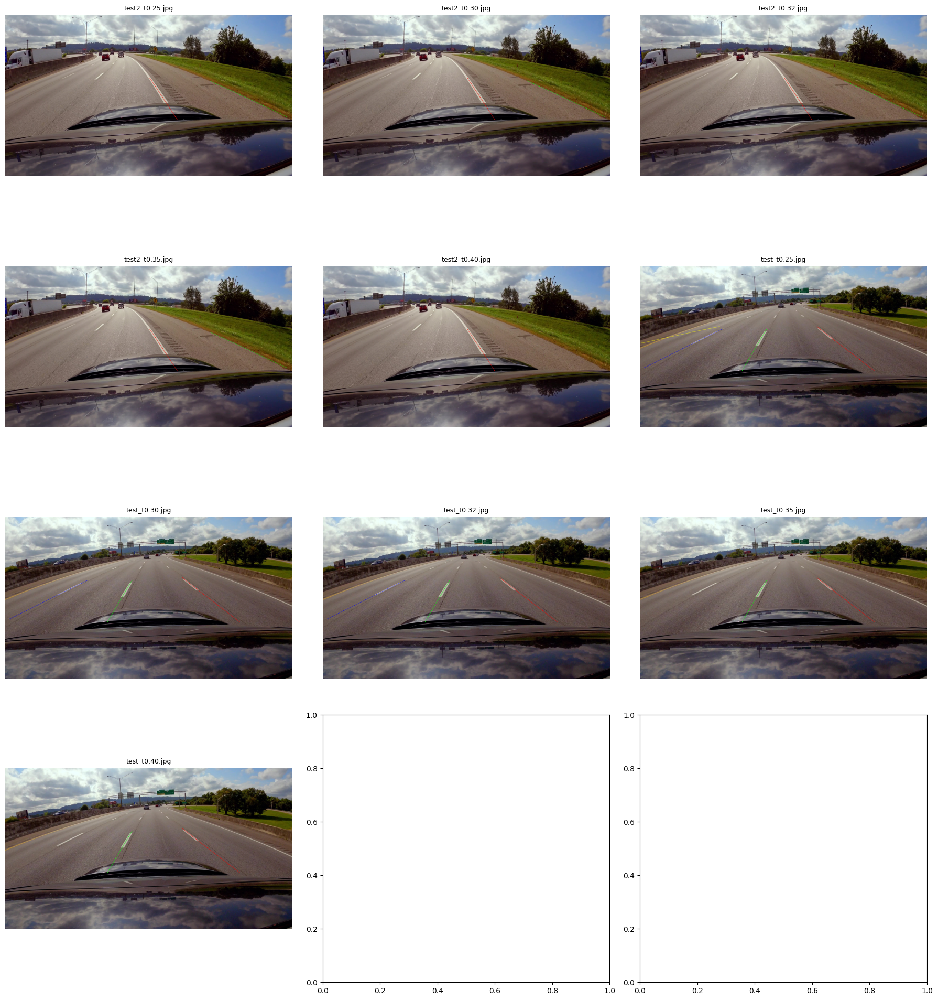

In [18]:
import matplotlib.pyplot as plt
import cv2, glob
paths = sorted(glob.glob("threshold_compare/*.jpg"))
n = len(paths)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(18, 5*rows))
for ax, p in zip(axes.flat, paths):
    img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    ax.imshow(img); ax.set_title(p.split("/")[-1], fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

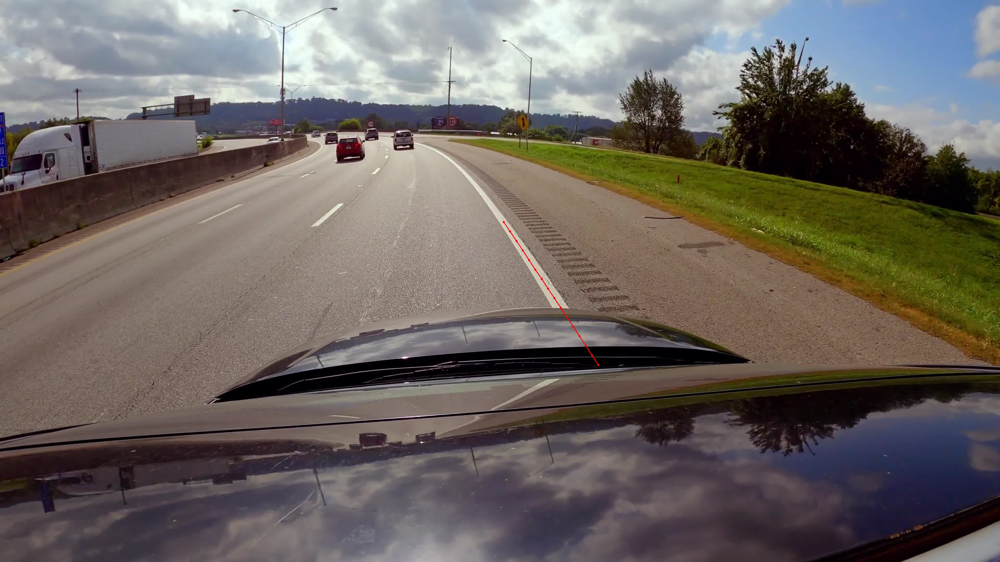

In [21]:
from IPython.display import Image
Image('threshold_compare/test2_t0.40.jpg')

In [22]:
!mv /content/CLRNet/weights/clrnet_infer_video.py /content/CLRNet/clrnet_infer_video.py

mv: cannot stat '/content/CLRNet/weights/clrnet_infer_video.py': No such file or directory


In [23]:
!find / -name "clrnet_infer_video.py" 2>/dev/null

/content/CLRNet/clrnet_infer_video.py


In [24]:
%cd /content/CLRNet
!ls clrnet_infer_video.py

/content/CLRNet
clrnet_infer_video.py


In [26]:
!/usr/local/miniconda/envs/clrnet/bin/python clrnet_infer_video.py \
    --video /content/my_dashcam_video.mp4 \
    --out out_lanes_test.mp4 \
    --conf-threshold 0.30 \
    --max-frames 100

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Overriding conf_threshold: 0.4 -> 0.3
Processed 50 frames...
Processed 100 frames...
Done. 100 frames -> out_lanes_test.mp4


In [28]:
!/usr/local/miniconda/envs/clrnet/bin/python clrnet_infer_video.py \
    --video /content/my_dashcam_video.mp4 \
    --out out_lanes_full2.mp4 \
    --conf-threshold 0.40

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Overriding conf_threshold: 0.4 -> 0.4
Processed 50 frames...
Processed 100 frames...
Processed 150 frames...
Processed 200 frames...
Processed 250 frames...
Processed 300 frames...
Processed 350 frames...
Processed 400 frames...
Processed 450 frames...
Processed 500 frames...
Processed 550 frames...
Processed 600 frames...
Processed 650 frames...
Processed 700 frames...
Processed 750 frames...
Processed 800 frames...
Done. 818 frames -> out_lanes_full2.mp4


In [31]:
!/usr/local/miniconda/envs/clrnet/bin/python clrnet_infer_video.py \
    --video /content/my_dashcam_video.mp4 \
    --out out_lanes_test.mp4 \
    --conf-threshold 0.30 \


pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Overriding conf_threshold: 0.4 -> 0.3
Processed 50 frames...
Processed 100 frames...
Processed 150 frames...
Processed 200 frames...
Processed 250 frames...
Processed 300 frames...
Processed 350 frames...
Processed 400 frames...
Processed 450 frames...
Processed 500 frames...
Processed 550 frames...
Processed 600 frames...
Processed 650 frames...
Processed 700 frames...
Processed 750 frames...
Processed 800 frames...
Done. 818 frames -> out_lanes_test.mp4


In [50]:
!find / -name "libnvidia-ml.so*" 2>/dev/null

/usr/local/cuda-12.8/targets/x86_64-linux/lib/stubs/libnvidia-ml.so
/usr/lib64-nvidia/libnvidia-ml.so.1
/usr/lib64-nvidia/libnvidia-ml.so.580.82.07
/usr/lib64-nvidia/libnvidia-ml.so


In [44]:
%env LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib
!/usr/local/miniconda/envs/clrnet/bin/python test_lower_thresh.py

env: LD_LIBRARY_PATH=/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib
No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
Traceback (most recent call last):
  File "test_lower_thresh.py", line 4, in <module>
    cfg, net, processes = build_model(
  File "/content/CLRNet/clrnet_infer_video.py", line 105, in build_model
    net = torch.nn.parallel.DataParallel(net, device_ids=[0]).cuda()
  File "/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/nn/modules/module.py", line 491, in cuda
    return self._apply(lambda t: t.cuda(device))
  File "/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/nn/modules/module.py", line 387, in _apply
    module._apply(fn)
  File "/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/nn/modules/module.py", line 387, in _apply
    module._apply(fn)
  File "/usr/local/miniconda/envs/clrnet/lib/python3.8/site

In [40]:
!/usr/local/miniconda/envs/clrnet/bin/python -c "
import os
os.environ['LD_LIBRARY_PATH'] = '/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:' + os.environ.get('LD_LIBRARY_PATH', '')
from clrnet.utils.config import Config
cfg = Config.fromfile('configs/clrnet/clr_resnet18_culane.py')
print('max_lanes:', cfg.max_lanes)
print('conf_threshold:', cfg.test_parameters)
"

SyntaxError: unterminated string literal (detected at line 8) (3314955290.py, line 8)

In [39]:
from clrnet.utils.config import Config
cfg = Config.fromfile('configs/clrnet/clr_resnet18_culane.py')
print('max_lanes:', cfg.max_lanes)
print('conf_threshold:', cfg.test_parameters)

ImportError: cannot import name 'nms_impl' from partially initialized module 'clrnet.ops' (most likely due to a circular import) (/content/CLRNet/clrnet/ops/__init__.py)

In [34]:
import os
os.environ['LD_LIBRARY_PATH'] = '/usr/local/miniconda/envs/clrnet/lib/python3.8/site-packages/torch/lib:' + os.environ.get('LD_LIBRARY_PATH', '')

!/usr/local/miniconda/envs/clrnet/bin/python clrnet_infer_video.py --test-frame test.jpg --out test_out.jpg

pretrained model:  https://download.pytorch.org/models/resnet18-5c106cde.pth
Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth

load_state_dict result: _IncompatibleKeys(missing_keys=['module.heads.sample_x_indexs', 'module.heads.prior_feat_ys', 'module.heads.prior_ys', 'module.heads.criterion.weight'], unexpected_keys=[])
Detected 0 lane(s)
Saved test_out.jpg


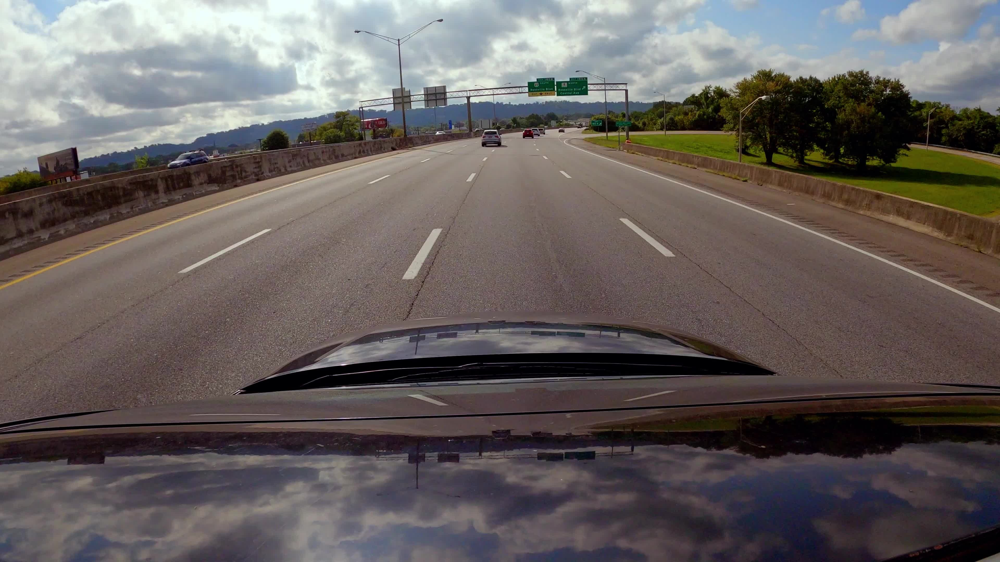

In [35]:
from IPython.display import Image
Image('test_out.jpg')